Leer Texto de imagenes

In [4]:
import easyocr
import os
import torch
from PIL import Image
import matplotlib.pyplot as plt
import shutil

Using CPU. Note: This module is much faster with a GPU.


CUDA disponible: False


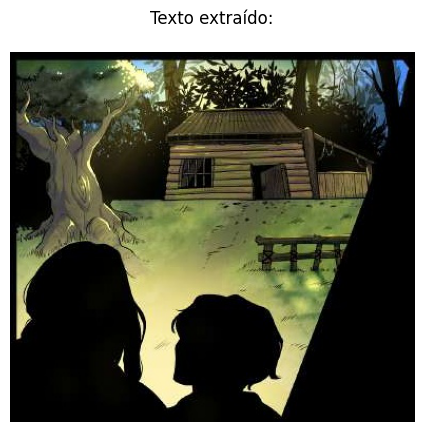

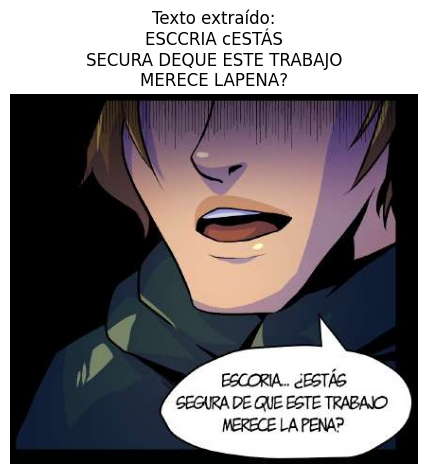

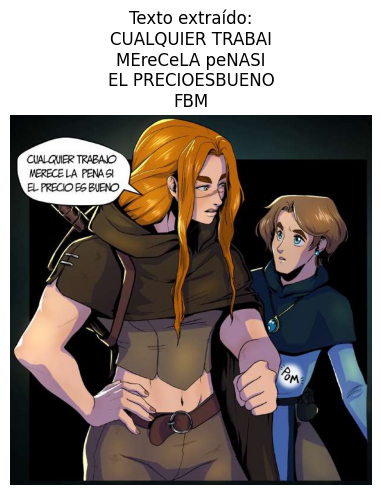

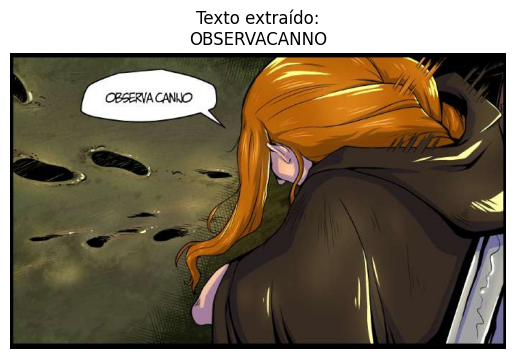

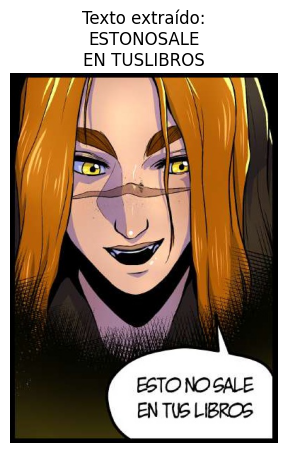

...

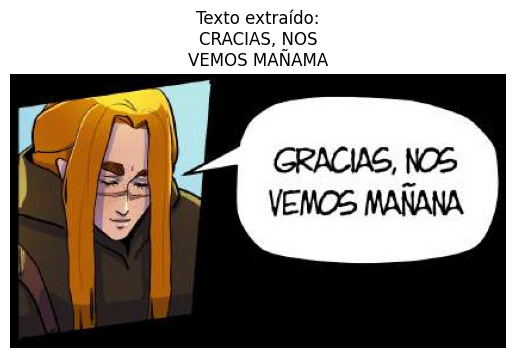

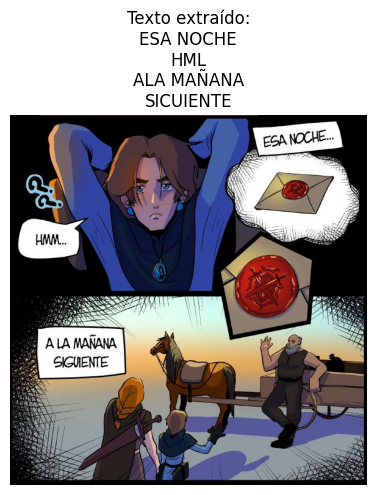

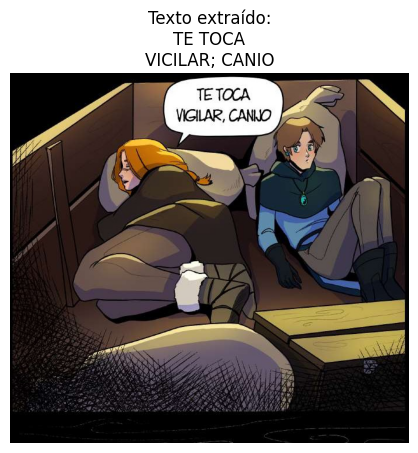

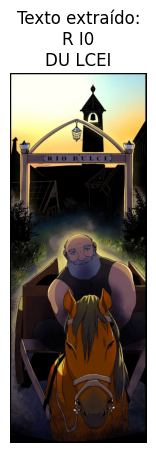

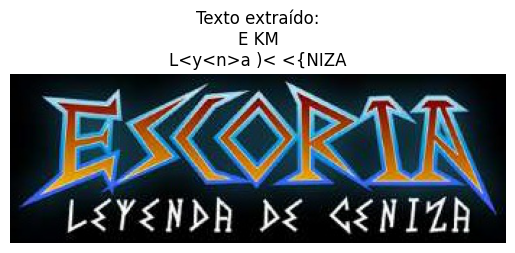

In [7]:
# Verificar si CUDA está disponible y configurar easyocr
use_cuda = torch.cuda.is_available()
print(f"CUDA disponible: {use_cuda}")

# Monkey patching para reemplazar Image.ANTIALIAS por Image.LANCZOS
if not hasattr(Image, 'ANTIALIAS'):
    Image.ANTIALIAS = Image.LANCZOS

# Inicializar el lector de easyocr con soporte CUDA si está disponible
reader = easyocr.Reader(['es'], gpu=use_cuda)

def extract_text_from_image(image_path):
    """Extrae texto de una imagen usando EasyOCR"""
    # Leer la imagen
    image = Image.open(image_path)
    # Extraer el texto de la imagen
    text = reader.readtext(image_path, detail=0)
    # Imprimir la imagen y el texto
    plt.imshow(image)
    plt.axis('off')
    plt.title('Texto extraído:\n' + '\n'.join(text))
    plt.show()
    return "\n".join(text)

def process_files_in_directory(input_base_folder, output_base_folder):
    """Procesa todos los archivos en un directorio y extrae texto de ellos usando EasyOCR"""
    for root, _, files in os.walk(input_base_folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
                file_path = os.path.join(root, file)
                relative_path = os.path.relpath(file_path, input_base_folder)
                output_folder = os.path.join(output_base_folder, os.path.dirname(relative_path))
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)
                
                # Extraer el texto de la imagen
                try:
                    text = extract_text_from_image(file_path)

                    # Guardar el texto extraído en un archivo de texto
                    output_file_path = os.path.join(output_folder, os.path.splitext(file)[0] + '.txt')
                    with open(output_file_path, 'w', encoding='utf-8') as text_file:
                        text_file.write(text)
                except Exception as e:
                    print(f"Error procesando la imagen {file_path}: {e}")
            else:
                print(f"El archivo {file} no tiene el formato correcto")

def limpiar_carpeta_salida(output_base_folder):
    if os.path.exists(output_base_folder):
        shutil.rmtree(output_base_folder)
    os.makedirs(output_base_folder)

# Directorios de entrada y salida
input_base_folder = '../../data/output/divide_images_test'
output_base_folder = '../../data/output/output_text_test'

# Limpiar la carpeta de salida antes de empezar
limpiar_carpeta_salida(output_base_folder)

# Verificar si el directorio de entrada existe
if os.path.exists(input_base_folder) and os.path.isdir(input_base_folder):
    # Extraer texto de todos los archivos en el directorio
    process_files_in_directory(input_base_folder, output_base_folder)
else:
    print(f"El directorio {input_base_folder} no existe o no es un directorio válido.")